# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---


## Computing the camera calibration using chessboard images



In [5]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
#%matplotlib qt
%matplotlib inline 
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)


## Saving the camera parameters to be used next time
I found it useful to use Pickle library to save data in python. I used it to save the  calibration matrix and distortion  for the camera, so I can just load it from the disk an proceed..., Here is how I used it:


In [6]:
import pickle
cameraCal = {'mtx': mtx , 'dist':dist}
pickle.dump( cameraCal, open( "camera.p", "wb" ) )
# Read in the saved objpoints and imgpoints

## You can start here, camera is already calibrated and saved in camera.p file
As the camera calibration matrices are saved, I can simply start from this point by loading the saved matrices.


In [7]:
import pickle
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
#%matplotlib qt
%matplotlib inline 
dist_pickle = pickle.load( open( "camera.p", "rb" ) )
savedMtx = dist_pickle["mtx"]
savedDist = dist_pickle["dist"]


## Apply a distortion correction to raw images.


In [8]:
#define a shorter function for unditrotion 
def unDisImg (img,mtx,dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

#define side by side plotting function    
def subPlot1by2(img1,img2, title = "Processed Image"):
    if len(img1.shape)>2:
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    if len(img2.shape)>2:
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(img2)
    ax2.set_title(title, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

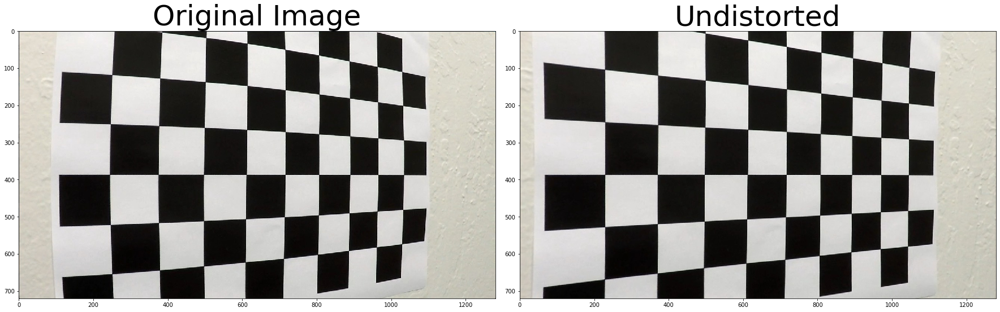

In [9]:
testCal = cv2.imread('./camera_cal/calibration5.jpg')
subPlot1by2(testCal,unDisImg(testCal,savedMtx,savedDist),'Undistorted')

## Use color transforms, gradients, etc., to create a thresholded binary image.


In [10]:
def combinedThresholds(img, HLS = 0 , Mode = 'all-OR'):
    # Apply each of the thresholding functions--
    ksize = 7
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    if HLS:
        img = hls[:,:,2]    
    gradx = absSobelThresh(img, orient='x', sobel_kernel=ksize, absThresh=(20,100 ))
    grady = absSobelThresh(img, orient='y', sobel_kernel=ksize, absThresh=(20,100 ))
    mag_binary = magThresh(img, sobel_kernel=ksize, magThresh=(20, 100))
    dir_binary = dirThreshold(img, sobel_kernel=ksize, dirThresh=(0.7,1.3))
    
    lMask = colourMask(hls[:,:,1], threshold=(200, 255))
    sMask = colourMask(hls[:,:,2], threshold=(170, 255))
    gradients = np.zeros_like(dir_binary)
    gradients[((gradx == 1) & (grady == 1) ) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    colour = np.zeros_like(dir_binary)
    colour[((lMask == 1) | (sMask == 1))] = 1
    combined = np.zeros_like(dir_binary)
    if Mode == 'gradients':
        combined[(gradients == 1)] = 1
    if Mode == 'colours':
        combined[ (colour == 1)] = 1 
    if Mode == 'all-OR':
        combined[(gradients == 1) | (colour == 1)] = 1  
    if Mode == 'all-AND':
        combined[(gradients == 1) & (colour == 1)] = 1
    if Mode == 'all-A':
        combined[ ((lMask == 1) | (sMask == 1)) | ((gradx == 1) & (mag_binary == 1) & (dir_binary == 1) )] = 1 
    return combined

def absSobelThresh(img, orient='x',sobel_kernel=3, absThresh=(20,100 )):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    if len(img.shape)>2:
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    else:
        gray = img
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient=='x':
        soble = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel)
    if orient=='y':
        soble = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    absSoble = np.absolute(soble) 
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaledSoble = np.uint8(absSoble*255/(np.max(absSoble)))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
    masked = np.zeros_like(scaledSoble)
            # is > thresh_min and < thresh_max
    masked [(scaledSoble > absThresh[0]) & (scaledSoble < absThresh[1])] = 1

    return masked

def magThresh(img, sobel_kernel=3, magThresh=(30, 100)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    if len(img.shape)>2:
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    else:
        gray = img
    # 2) Take the gradient in x and y separately
    sobelX = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobelY = cv2.Sobel(gray, cv2.CV_64F, 0,1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    sobelMag = np.sqrt(sobelX**2 + sobelY**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaledMag = np.uint8(255*sobelMag/np.max(sobelMag))
    # 5) Create a binary mask where mag thresholds are met
    mask = np.zeros_like(scaledMag)
    # 6) Return this mask as your binary_output image
    mask [ (scaledMag >=  magThresh[0]) & (scaledMag <=  magThresh[1]) ]  = 1
    return mask

def dirThreshold(img, sobel_kernel=3, dirThresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    if len(img.shape)>2:
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    else:
        gray = img
    # 2) Take the gradient in x and y separately
    sobelX = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel )
    sobelY = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel )
    absSobelX = np.absolute(sobelX)
    absSobelY = np.absolute(sobelY)

    # 3) Take the absolute value of the x and y gradients
    sobelMAg = np.sqrt(sobelX**2 + sobelY**2)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    sobelDir = np.arctan2(absSobelY, absSobelX)
    # 5) Create a binary mask where direction thresholds are met
    mask = np.zeros_like(sobelDir)
    mask[(sobelDir >= dirThresh[0]) & (sobelDir <= dirThresh[1]) ] = 1
    # 6) Return this mask as your binary_output image
    return mask

def colourMask(img, threshold=(0, 255)):
    mask = np.zeros_like(img)
    mask[(img >= threshold[0]) & (img <= threshold[1])] = 1
    return mask



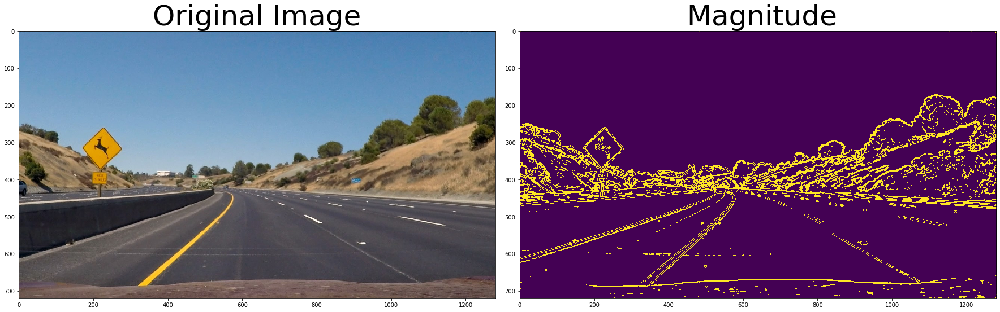

In [12]:
testImg = cv2.imread('./test_images/test2.jpg')
subPlot1by2(testImg,magThresh(testImg, sobel_kernel=7, magThresh=(30, 100)),' Magnitude')

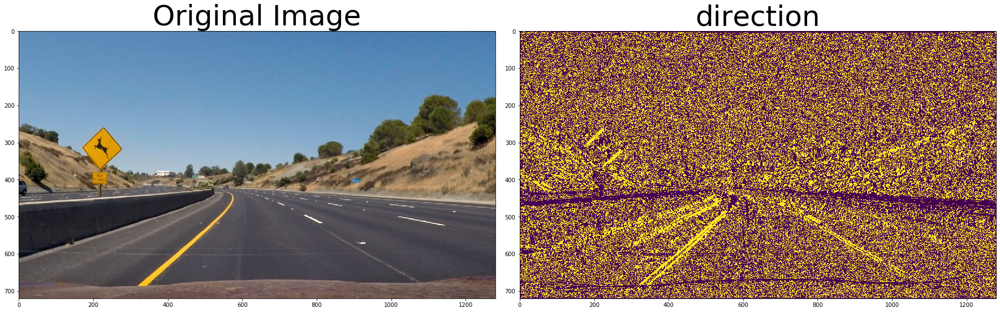

In [13]:
subPlot1by2(testImg,dirThreshold(testImg, 7, (0.7,1.3)), 'direction')

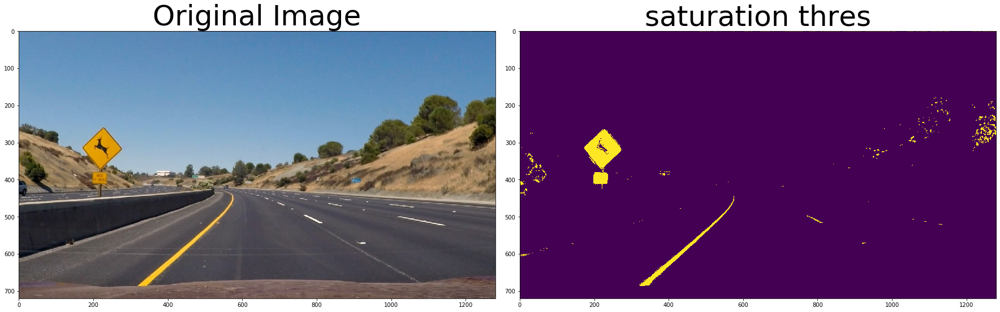

In [14]:
img = cv2.cvtColor(testImg, cv2.COLOR_BGR2HLS)[:,:,2]

subPlot1by2(testImg,colourMask(img, threshold=(170, 255)), 'saturation thres')

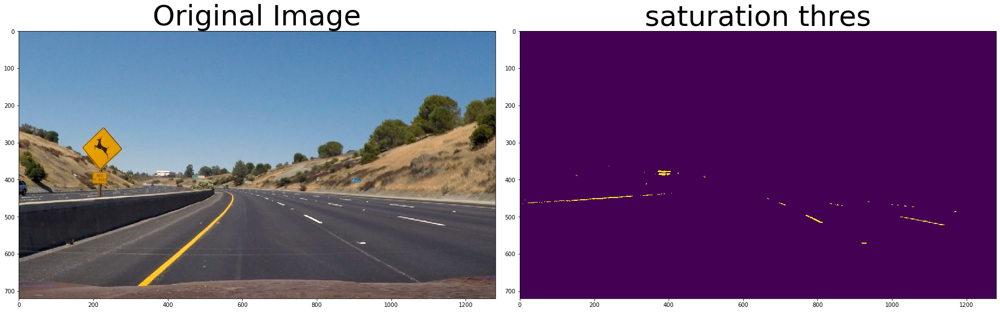

In [15]:
img = cv2.cvtColor(testImg, cv2.COLOR_BGR2HLS)[:,:,1]
subPlot1by2(testImg,colourMask(img, threshold=(200, 255)), 'saturation thres')

### Testing the final combination with the diffrent options introduced before

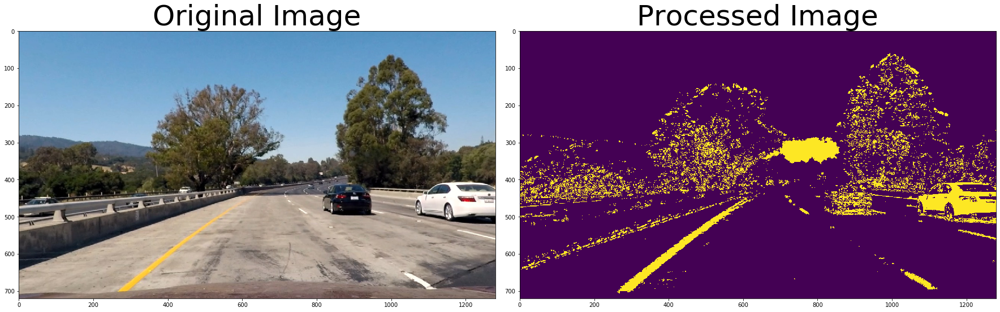

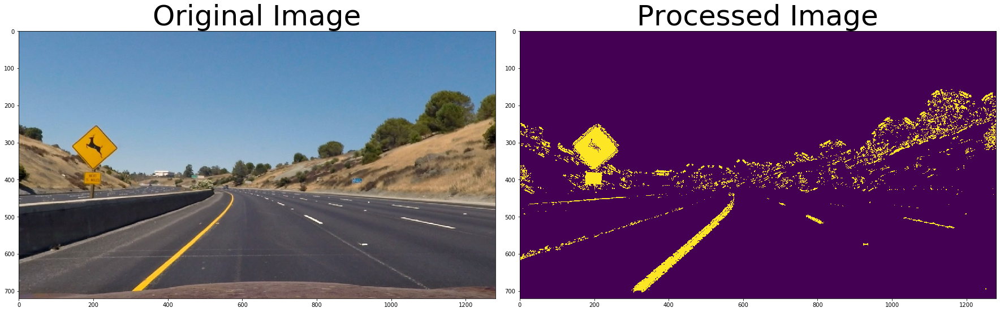

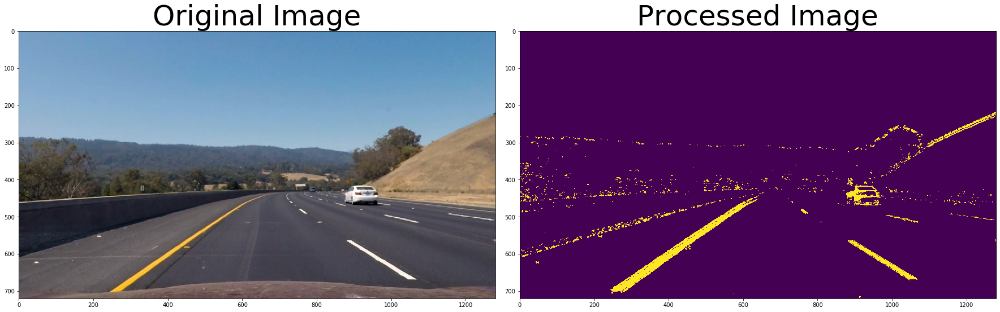

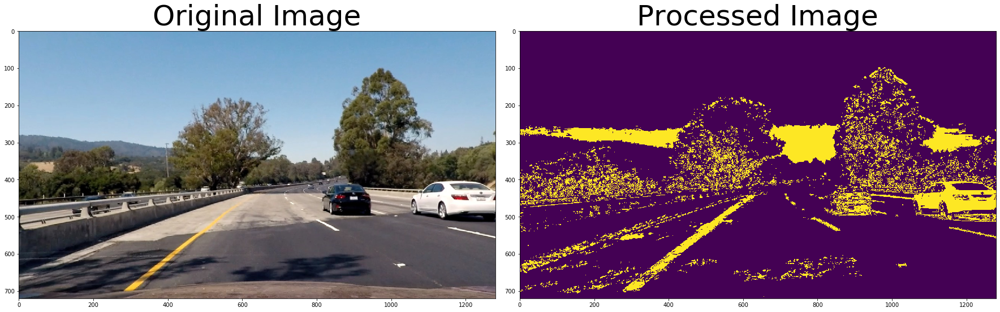

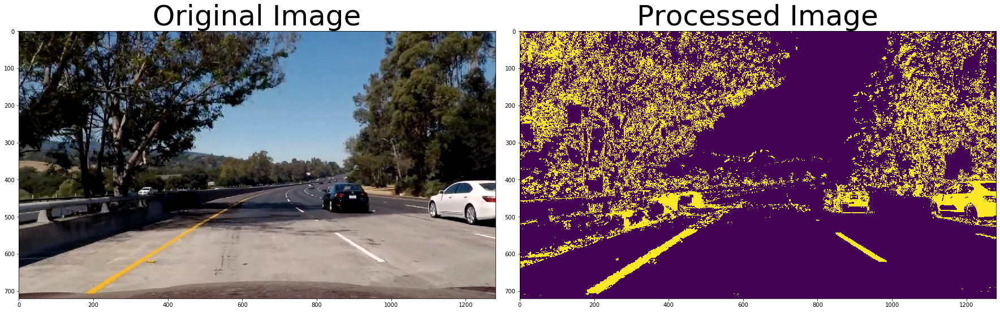

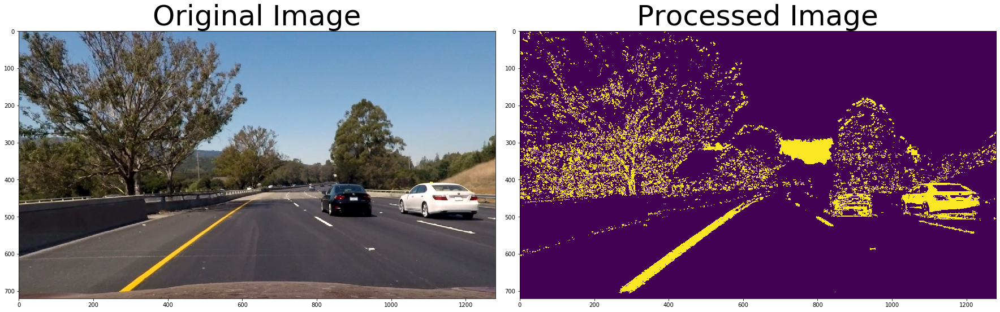

In [16]:
for image in glob.glob('./test_images/test*.jpg'):
    image = unDisImg(cv2.imread(image),savedMtx,savedDist)
    filteredLanes = combinedThresholds(image, HLS = 1 , Mode = 'all-OR')
    subPlot1by2(image,filteredLanes)

##  Apply a perspective transform to rectify binary image ("birds-eye view").


In [17]:

def perspective_transform(image,depth = 0.62 ):
    height, width = image.shape[:2]
    Ytop = height * depth
    # verties coordinates in the source image
    topLsrc = [width // 2 - 65, Ytop]
    topRsrc = [width // 2 + 65, Ytop]
    btmRsrc = [width -50, height]
    btmLsrc = [50, height]
    src = np.float32([topLsrc, topRsrc, btmRsrc, btmLsrc])
    #  verties coordinates in the Warpped image
    topLdst = [100,-0]
    topRdst = [width -100 , 0]
    btmRdst = [width -100 , height]
    btmLdst = [100, height]

    dst = np.float32([topLdst, topRdst, btmRdst, btmLdst])
    # perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
 
    # Warp the image
   
    # We also calculate the oposite transform
    unwrap_m = cv2.getPerspectiveTransform(dst, src)
    return (M, unwrap_m)

def warpedImage(image,M):
    height, width = image.shape[:2]
    warped = cv2.warpPerspective(image, M, (width, height))
    return warped

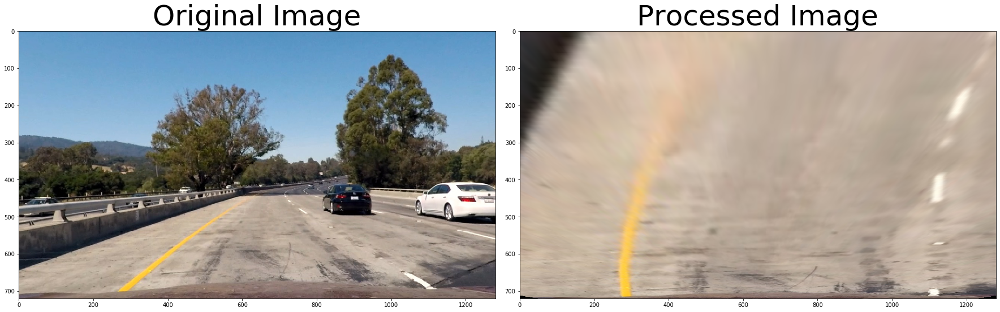

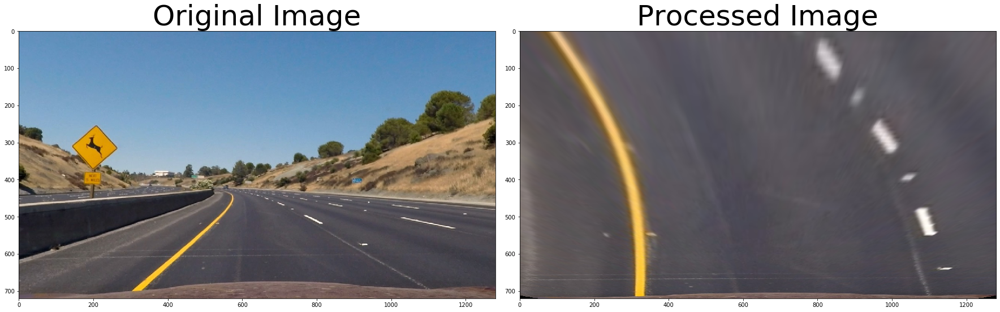

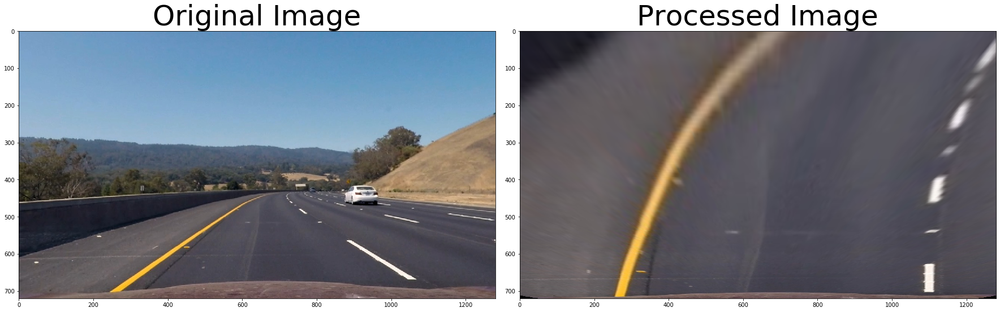

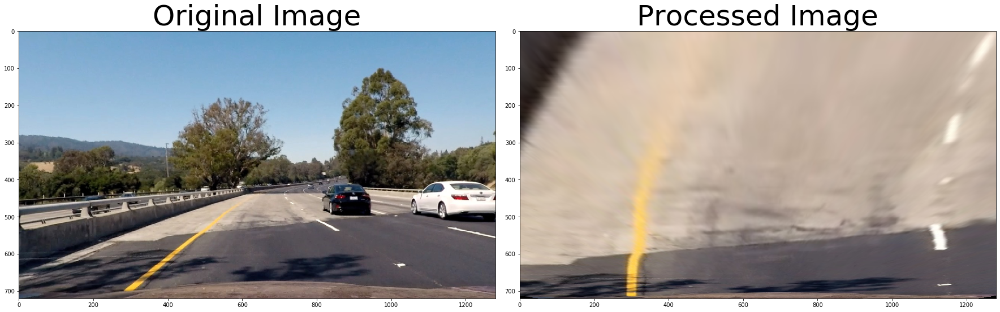

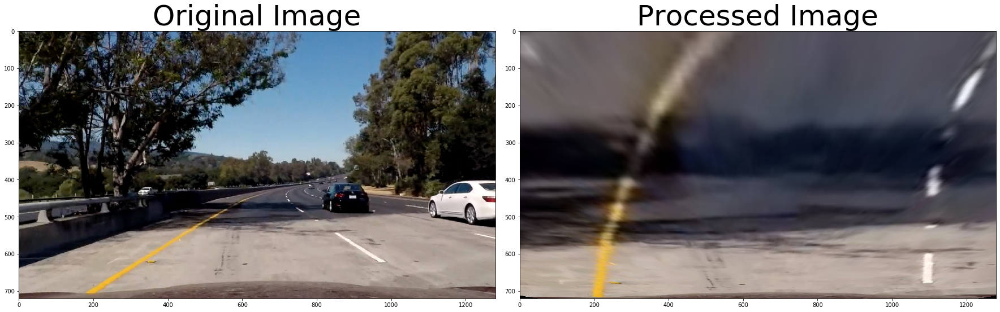

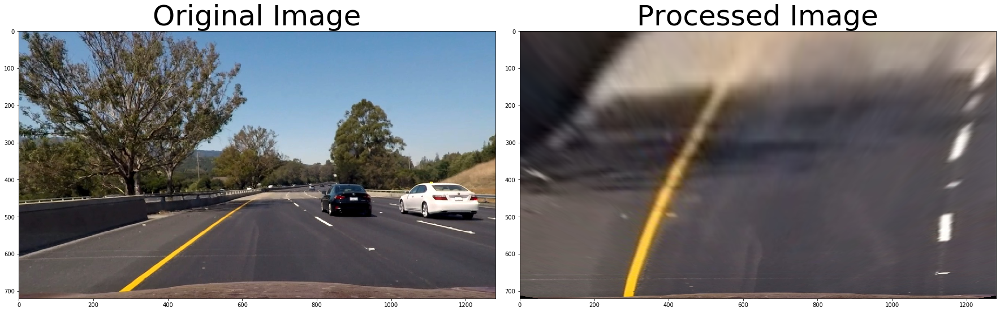

In [18]:

for image in glob.glob('test_images/test*.jpg'):
    image = unDisImg(cv2.imread(image),savedMtx,savedDist)
    M, unwrap_m = perspective_transform(image) 
    warpedImg = warpedImage(image,M)
    subPlot1by2(image,warpedImg)

## Detect lane pixels and fit to find the lane boundary.


In [19]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )

    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fitx,right_fitx, ploty, left_fit ,right_fit


def fit_poly(img_shape, leftx, lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty, left_fit,right_fit

def search_around_poly(binary_warped, left_fit,right_fit):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty,left_fit,right_fit = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array(np.transpose([left_fitx-margin, ploty])).reshape(-1,2)
    left_line_window2 = np.array(np.flipud(np.transpose([left_fitx+margin, ploty]))).reshape(-1,2)
    #print("left_line_window1",left_line_window1)

    left_line_pts = np.vstack((left_line_window1, left_line_window2))

    #print("left_line_window2",left_line_window2)
    #print("left_line_pts",left_line_pts)

    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])

    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

#     # Plot the polynomial lines onto the image
#     #plt.plot(left_fitx, ploty, color='yellow')
#     #plt.plot(right_fitx, ploty, color='yellow')
#     ## End visualization steps ##
    
    return out_img,left_fitx, right_fitx, ploty,left_fit,right_fit





## Determine the curvature of the lane and vehicle position with respect to center.


In [20]:
def measure_curvature_real(ploty, left_fitx,right_fitx):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/840 # meters per pixel in x dimension
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix , 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    fit = 0.5 * left_fit_cr + 0.5 *right_fit_cr
   
     # Calculation of R_curve (radius of curvature)
    #left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    #right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    radius = ((1 + (2*fit[0]*y_eval*ym_per_pix + fit[1])**2)**1.5) / np.absolute(2*fit[0])
    return radius

def draw_text(frame, text, x, y):
    cv2.putText(frame, text, (x, y), cv2.FONT_HERSHEY_DUPLEX, 0.6, (255, 255, 255), 1)

def laneInfo(right_fitx,left_fitx, imgWidth):
    xm_per_pix = 3.7/840 # meters per pixel in x dimension
    laneWidthPx = right_fitx[719] - left_fitx[719] 
    #print('lane width', laneWidthPx)
    laneWidthM = laneWidthPx * xm_per_pix
    laneCenter = (right_fitx[719] + left_fitx[719]) //2
    carCenter = imgWidth//2
    distFromCenterPx = carCenter - laneCenter
    distFromCenterM = distFromCenterPx * xm_per_pix
    return distFromCenterM, laneWidthM
    



## Warp the detected lane boundaries back onto the original image.


In [21]:
def overlay(image,  left_fitx,right_fitx,radius, unwrap_m=None):
    overlay = np.zeros_like(image).astype(np.uint8)
    
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )

                       
    rightLinePoints = np.array([np.transpose(np.vstack([right_fitx, ploty]))])

    leftLinePoints = np.array([np.flipud(np.transpose(np.vstack([left_fitx, 
                              ploty])))])
    points= np.hstack((rightLinePoints, leftLinePoints))
                       
    cv2.fillPoly(overlay, np.int_([points]), (0,255, 0))
    distFromCenterM, laneWidthM = laneInfo(right_fitx,left_fitx, image.shape[1])


    if unwrap_m is not None:
        overlay = cv2.warpPerspective(overlay, unwrap_m, (image.shape[1], image.shape[0]))

    alpha = 0.6
    out = cv2.addWeighted(image, alpha, overlay, 1 - alpha, 0)
    if radius < 1500:
        draw_text(out, 'Radius of road curvature:  {:.1f} m'.format(radius), 900, 80)
    else:
        draw_text(out, 'Straight Road', 900, 80)
    draw_text(out, 'laneWidth :  {:.1f} m'.format(laneWidthM), 900, 60)
    if distFromCenterM > 0:
        draw_text(out, '{:.1f} m away from center to the Right'.format(distFromCenterM), 900, 40)
    else:
        draw_text(out, '{:.1f} m away from center to the left'.format(-1*distFromCenterM), 900, 40)
    return out

## Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

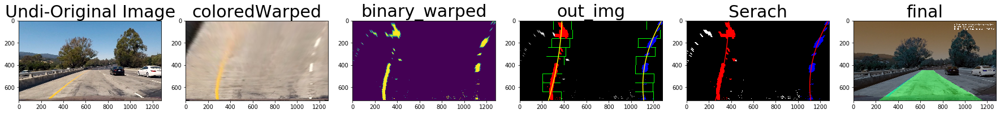

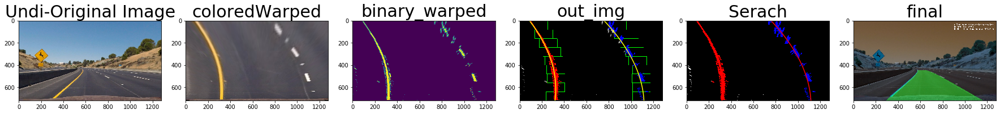

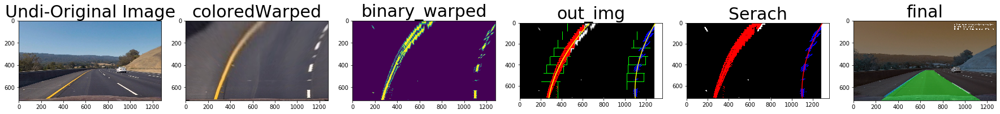

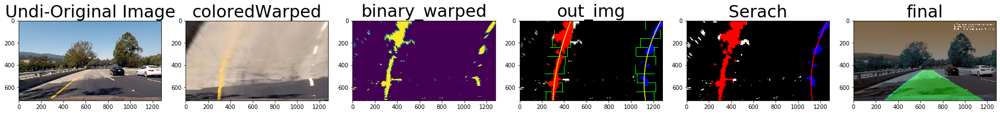

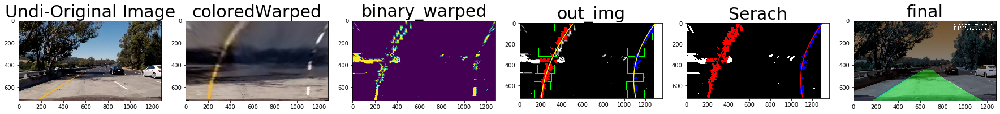

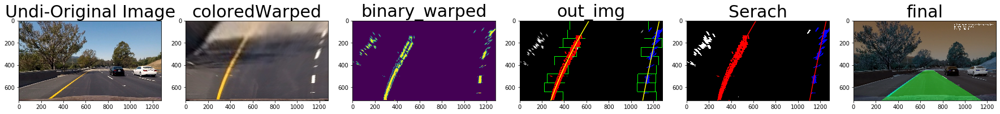

In [22]:

for image in glob.glob('test_images/test*.jpg'):
    image = cv2.imread(image)
    undismage = unDisImg(image,savedMtx,savedDist)
    masked = combinedThresholds(undismage, HLS = 0, Mode = 'all-A')
    M, unwrap_m = perspective_transform(image) 
    coloredWarped = warpedImage(image,M)
    binary_warped = warpedImage(masked,M)
    out_img, left_fitx,right_fitx, ploty, left_fit ,right_fit= fit_polynomial(binary_warped)
    region,left_fitx, right_fitx, ploty,left_fit,right_fit = search_around_poly(binary_warped, left_fit,right_fit)
    radius = measure_curvature_real(ploty, left_fitx,right_fitx)
    final = overlay(image,  left_fitx,right_fitx, radius, unwrap_m=unwrap_m)
    
    #Comment the next 3 lines to disable opencv window
    cv2.imshow("final",final)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    
    f, (ax1, ax2, ax3, ax4,ax5, ax6) = plt.subplots(1, 6,  figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(undismage, cv2.COLOR_BGR2RGB))
    ax1.set_title('Undi-Original Image', fontsize=30)
    ax2.imshow(cv2.cvtColor(coloredWarped, cv2.COLOR_BGR2RGB))
    ax2.set_title("coloredWarped", fontsize=30)
    ax3.imshow(binary_warped)
    ax3.set_title("binary_warped", fontsize=30)
    
    
    ax4.imshow(out_img)
    ax4.plot(left_fitx, ploty, color='yellow')
    ax4.plot(right_fitx, ploty, color='yellow')
    ax4.set_title("out_img", fontsize=30)
    
    

    ax5.imshow(region)
    ax5.plot(left_fitx, ploty, color='red')
    ax5.plot(right_fitx, ploty, color='red')
    ax5.set_title("Serach", fontsize=30)
    
    
    ax6.imshow(final)

    ax6.set_title("final", fontsize=30)
   

    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    


## Pipeline 


In [23]:
def pipeline(image,savedMtx,savedDist, M, unwrapMtx, left_fit = None, right_fit = None , firstFrame = True):
    undismage = unDisImg(image,savedMtx,savedDist)
    masked = combinedThresholds(undismage, HLS = 1, Mode = 'all-OR')
    #coloredWarped, _ = perspective_transform(image)
    binary_warped = warpedImage(masked,M)
    if firstFrame:
        out_img, left_fitx,right_fitx, ploty, left_fit ,right_fit= fit_polynomial(binary_warped)
    else:
        _ ,left_fitx, right_fitx, ploty,left_fit,right_fit = search_around_poly(binary_warped,left_fit,right_fit)
    
    radius = measure_curvature_real(ploty,left_fitx,right_fitx)
    final = overlay(image, left_fitx,right_fitx, radius, unwrap_m=unwrapMtx )
    return final , right_fit, left_fit

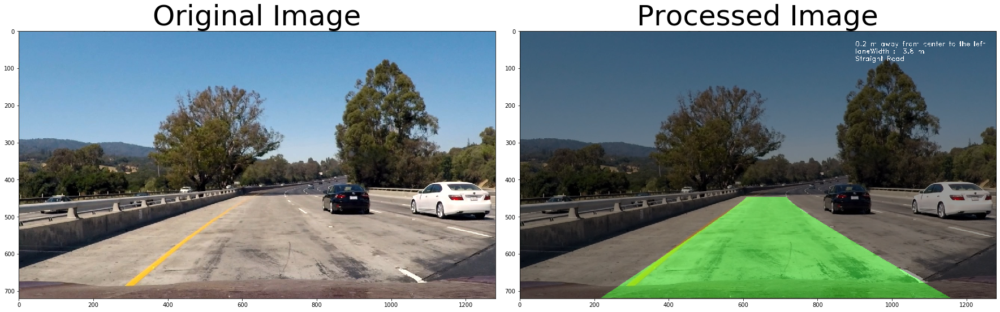

In [24]:
image = cv2.imread('test_images/test1.jpg')
M, unwrapMtx = perspective_transform(image)

final,  right_fit, left_fit = pipeline(image,savedMtx,savedDist,M, unwrapMtx, left_fit = None, right_fit = None , firstFrame = True)
subPlot1by2(image,final)

# cv2.imshow("combined",final)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

## Video Pipeline

In [25]:
def videoProcess(videoPath, SaveTo = None):
    # Create a VideoCapture object and read from input file
# If the input is the camera, pass 0 instead of the video file name
    vid = cv2.VideoCapture(videoPath)
    # Check if camera opened successfully
    if (vid.isOpened()== False): 
        print("Error opening video stream or file")
        


    #initalize windows for first frame
    M= None
    unwrapMtx = None
    right_fit = None
    left_fit = None
    width = None
    height = None
    UpdateRate = 15
    ret, frame = vid.read()

    if ret == True:
        M, unwrapMtx = perspective_transform(frame)
        height, width = frame.shape[:2] 
        #frame = cv2.resize(frame,(int(width*0.5),int(height*0.5)))
        outImg , right_fit, left_fit = pipeline(frame,savedMtx,savedDist, M, unwrapMtx, left_fit = None, right_fit = None , firstFrame = True)
    if SaveTo != None:
        out = cv2.VideoWriter((SaveTo + '.mp4'),cv2.VideoWriter_fourcc(*'MP4V'), 10, (width,height))

    frameCount = 0    
    # Read until video is completed
    while(vid.isOpened()):
        # Capture frame-by-frame
        ret, frame = vid.read()
        if ret == True:
            frameCount = frameCount + 1
            height, width = frame.shape[:2] 

            #frame = cv2.resize(frame,(int(width*0.5),int(height*0.5)))

            #outImg , right_fit, left_fit = pipeline(frame,savedMtx,savedDist, left_fit = None, right_fit = None , firstFrame = True)
            if frameCount% UpdateRate == 0:
                outImg , right_fit, left_fit = pipeline(frame,savedMtx,savedDist, M, unwrapMtx, left_fit = None, right_fit = None , firstFrame = True)
                draw_text(outImg, 'Updating windows', 10, 80)

            else:
                outImg , right_fit, left_fit = pipeline(frame,savedMtx,savedDist, M, unwrapMtx, left_fit = left_fit, right_fit = right_fit , firstFrame = False)
            # Display the resulting frame
            cv2.imshow('Frame',outImg)
            if SaveTo != None:
                out.write(outImg)

            # Press Q on keyboard to  exit
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break

        # Break the loop
        else: 
            break

    # When everything done, release the video capture object
    vid.release()
    if SaveTo != None:
        out.release()

    # Closes all the frames
    cv2.destroyAllWindows()

In [136]:
videoProcess('./input_videos/project_video.mp4', "project_videoOut")